In [1]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches
import mplstereonet
import skimage.exposure
import harmonica as hm
import verde as vd

import micromag as mg

import time

# Read QDM data

First, we create a read the observation points.

In [2]:
nc_file = "NRM3.mat"
data_dir = pathlib.Path("")/"real-data"
data = mg.load_qdm(data_dir / nc_file)

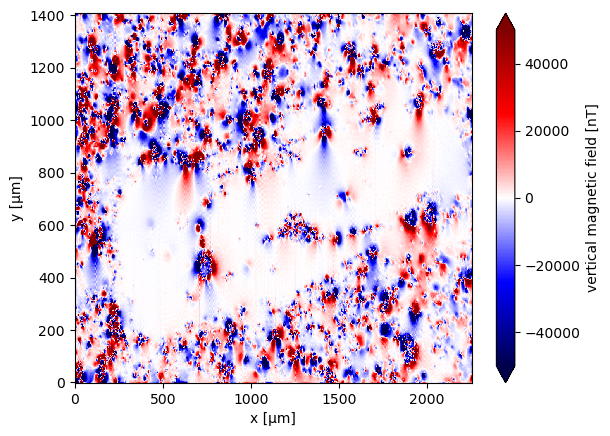

In [3]:
data.bz.plot.pcolormesh(cmap="seismic", vmax=50000, vmin=-50000)

In [4]:
# copy data sets
data_copy = data.copy(deep=True)
data_copy2 = data_copy.copy(deep=True)

x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

# Anomaly detection

First part of our method is an automatic way to detect and separate the signal of each dipole in the data. This is done in the following steps:

1. Upward continue the data to suppress high frequency noise
2. Calculate the total gradient amplitude (TGA) to concentrate the anomalies on top of the sources
3. Contrast stretch the TGA to highlight weaker sources
4. Run the Laplacian of Gaussian (LoG) method for blog detection to find the anomalies

## 1. Upward continue the data to suppress the high-frequency noise

In this step, we want to upward continue as little as possible to make sure we retain most of the signal.

In [5]:
height_difference = 5

# Have to assign the same points as the data because the Harmonica
# transforms give slightly different coordinates due to round-off.
# This is a bug and is being worked on.
data_up = (
    hm.upward_continuation(data.bz, height_difference)
    .assign_attrs(data.bz.attrs)
    .to_dataset(name="bz")
    .assign_coords(x=data.x, y=data.y)
    .assign_coords(z=data.z + height_difference)
)
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 9MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -1.805e+04 -2.676e+04 ... -1.871e+03 -8.093e+03

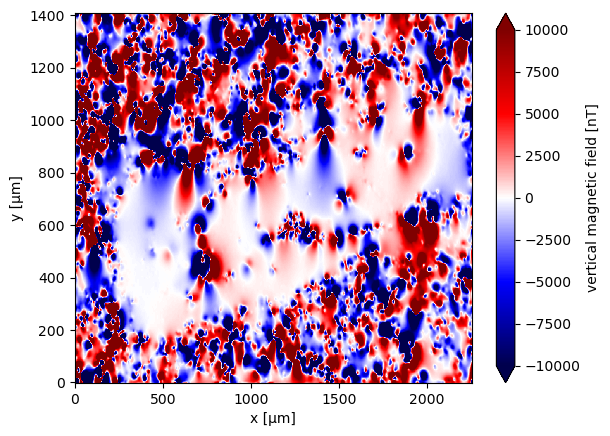

In [6]:
data_up.bz.plot.pcolormesh(cmap="seismic", vmax=10000, vmin=-10000)

## 2. Calculate the TGA

We do this with finite difference derivatives to avoid amplifying noise.

In [7]:
data_up = data_up.assign(mg.data_gradients(data_up.bz))
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)
/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -1.805e+04 -2.676e+04 ... -1.871e+03 -8.093e+03
    tga      (y, x) float64 5MB 4.334e+03 5.122e+03 ... 2.416e+03 2.686e+03
    x_deriv  (y, x) float64 5MB -3.707e+03 -3.188e+03 ... -2.122e+03 -2.647e+03
    y_deriv  (y, x) float64 5MB -441.8 -907.5 -1.236e+03 ... 213.3 47.55 -396.6
    z_deriv  (y, x) float64 5MB 2.201e+03 3.905e+03 ... -1.155e+03 -219.2

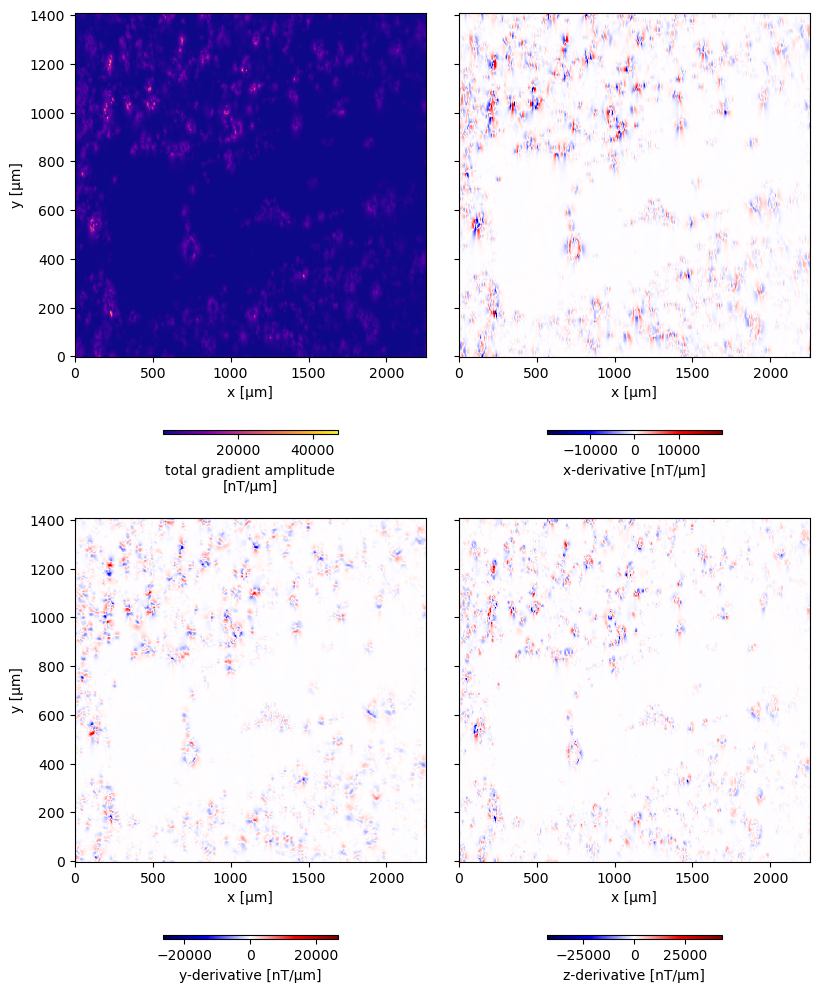

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(8, 10), sharey="row")
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.15, shrink=0.5)
for field, ax in zip(["tga", "x_deriv", "y_deriv", "z_deriv"], axes.ravel()):
    if field == "tga":
        cmap = "plasma"
    else:
        cmap="seismic"
    data_up[field].plot.pcolormesh(ax=ax, cmap=cmap, cbar_kwargs=cbar_kwargs)
for ax in axes.ravel():
    ax.set_aspect("auto")
    
axes[0,1].set_ylabel(None)
axes[1,1].set_ylabel(None)
plt.tight_layout(pad=0, h_pad=0, w_pad=2)

## 3. Stretch the contrast

Now we need to stretch the contrast of the TGA to make the anomalies easier to detect.

In [9]:
stretched = skimage.exposure.rescale_intensity(
    data_up.tga, 
    in_range=tuple(np.percentile(data_up.tga, (1, 99))),
)
data_up = data_up.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

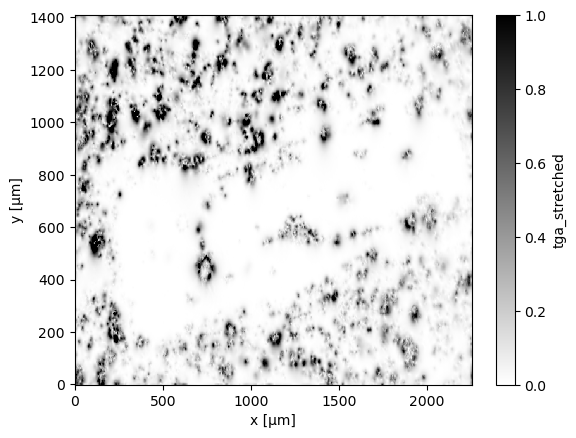

In [10]:
data_up.tga_stretched.plot.pcolormesh(cmap="gray_r")

## 4. Blob detection

To detect the bounding boxes of each anomaly, we use the LoG method in scikit-image. The code below calls it with some conveniences, like passing the range of anomaly sizes in physical units (µm) instead of number of pixels. It returns the bounding box of each anomaly (x_min, x_max, y_min, y_max) also in physical units.

In [13]:
start_detection_time = time.perf_counter()

windows = mg.detect_anomalies(
    data_up.tga_stretched, 
    size_range=[20, 100],
    size_increment=1.0,
    threshold=0.05,
    overlap=1.0,
    exclude_border=30,
    nsizes=20,
)

end_detection_time = time.perf_counter()

In [14]:
detection_time = end_detection_time-start_detection_time

print(f'{np.shape(windows)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

565 potential sources detected within 1.7608 seconds


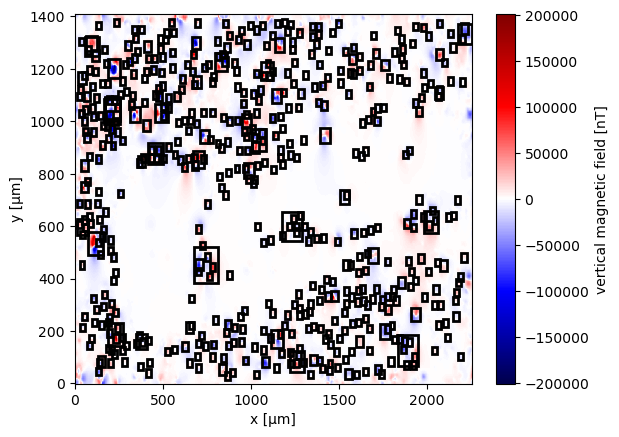

In [15]:
ax = plt.subplot(111)
data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

Now that we know the bounding box of each anomaly, we can run the Euler deconvolution and moment inversion for each anomaly separately.

# Euler Deconvolution and Inversion (Standard method)

Run the Euler Deconvolution and the inversion on each window.

In [16]:
start_inversion_time = time.perf_counter()

positions = []
estimated_dipole_moments = []
estimated_stds = []
calculated_r2 = []
calculated_SNR = []
windows_filtered = []
base_levels = []
for window in windows:
    anomaly = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
#     anomaly = data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    data_minus_background = anomaly.bz.values - base_level
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    moment, covariance, r2, SNR = mg.dipole_moment_inversion(
        anomaly.data_minus_background, position,
    )
    
    # Filter out solutions that don't meet quality criteria
    bad_euler = False # position[2] > 0
    poor_fit = False
    
#    bad_euler = position[2] > 0
#     poor_fit = r2 < 0.85
    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s"%(r2,SNR))  
    positions.append(position)  
    estimated_dipole_moments.append(moment)
    estimated_stds.append(mg.covariance_to_angle_std(moment, covariance))
    calculated_r2.append(r2)
    calculated_SNR.append(SNR)
    windows_filtered.append(window)
    base_levels.append(base_level)
positions = np.transpose(positions)


end_inversion_time = time.perf_counter()

In [17]:
inversion_time = end_inversion_time-start_inversion_time
print(f"{positions.shape[1]} euler positions and dipole moments estimated within {round(inversion_time, 4)} seconds", )

565 euler positions and dipole moments estimated within 2.8037 seconds


# Iterative Euler deconvolution

In [18]:
import scipy as sp
import numba
import choclo
# @numba.jit(nopython=True, parallel=True)
def goal_function(parameter, obs_data, coordinates, amplitude, x_0, y_0, z_0):
    bz = mg.dipole_bz(coordinates, 
                      ([parameter[0]*x_0], [parameter[1]*y_0], [parameter[2]*z_0]),
                     np.array([parameter[3], parameter[4], parameter[5]])*amplitude
                     )
                   
    
    Res = np.linalg.norm(obs_data-bz.ravel())
    # print(Res)
    return(Res)

In [19]:
x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

In [20]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()


x_concat = []
y_concat = []
z_concat = []
bz_concat = []
xc_concat = []
yc_concat = []
zc_concat = []
z_deriv_concat = []

estimated_dipole_moments_itr_euler = []

# fitting parameters
calculated_r2_itr_euler = []
calculated_SNR_itr_euler = []

data_copy = data.copy(deep=True)
data_up_copy = data_up.copy(deep=True)

base_levels_itr_euler = []
#################################
for window in rich.progress.track(np.array(windows), total = len(np.array(windows))):
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )

    base_levels_itr_euler.append(base_level)
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2


    estimated_dipole_moments_itr_euler.append(moment)
    
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard
    
#     print(discard.max())
    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s | %s"%(r2,SNR,position[2]))  
    xx, yy = np.meshgrid(anomaly.x.values, anomaly.y.values)
    x_concat = np.append(x_concat, xx)
    y_concat = np.append(y_concat, yy)    
    z_concat = np.append(z_concat, anomaly.z.values)
    bz_concat = np.append(bz_concat, anomaly.bz.values)
    z_deriv_concat = np.append(z_deriv_concat, anomaly.z_deriv.values)
    xc_concat = np.append(xc_concat, position[0])
    yc_concat = np.append(yc_concat, position[1])
    zc_concat = np.append(zc_concat, position[2])
    calculated_r2_itr_euler = np.append(calculated_r2_itr_euler, r2)
    calculated_SNR_itr_euler = np.append(calculated_SNR_itr_euler, SNR)


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

In [21]:
itr_euler_time = end_itr_euler_time-start_itr_euler_time
print(f"Time for the iterative Euler solution and dipole moment estimation: {round(itr_euler_time, 4)} seconds", )

Time for the iterative Euler solution and dipole moment estimation: 127.104 seconds


In [22]:
df = pd.DataFrame({'x':x_concat,
                   'y':y_concat,
                   'z':z_concat,
                  'bz':bz_concat,
                 'z_deriv':z_deriv_concat})

df.head()

,x,y,z,bz,z_deriv
0,665.05,1278.4,10.0,8148.381596,-1281.658111
1,667.40,1278.4,10.0,7163.800218,-1276.476770
2,669.75,1278.4,10.0,4112.740436,-730.950863
3,672.10,1278.4,10.0,-1024.149571,476.960880
4,674.45,1278.4,10.0,-6518.590856,2738.694594


In [23]:
positions_itr = np.array([xc_concat, yc_concat, zc_concat])

In [24]:
# indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# indexes
# euler_r2_itr_cond

Output()

Output()

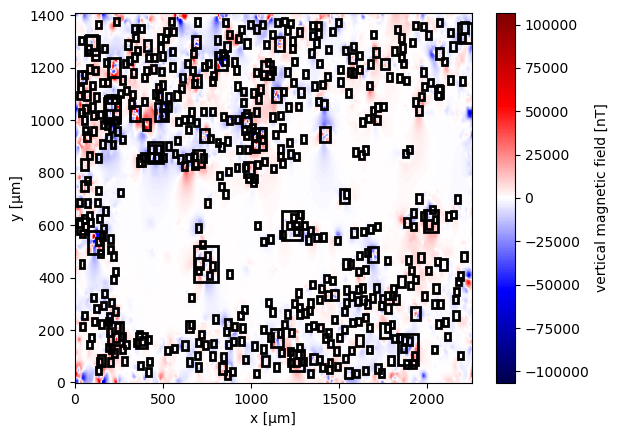

In [25]:
## EULER ENHANCEMENT SECOND STEP
warnings.filterwarnings("ignore")
data_copy = data.copy(deep=True)
euler_r2_itr_cond = calculated_r2_itr_euler>=0.999

zc_concat_temp = list()
xc_concat_temp = list()
yc_concat_temp = list()

estimated_dipole_moments_itr_euler_temp = list()

indexes = np.where(np.array(euler_r2_itr_cond))[0]
# SOURCES WITH R2 >= 0.99 ARE NOT ENHANCED, WE CALCULATE THEIR ANOMALY AND REMOVE THEM FROM THE DATA SET
# for index, window in enumerate(rich.progress.track(np.array(windows)[euler_r2_itr_cond], total=len(np.array(windows)[euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    position = positions_itr[:, index]
    estimated_dipole_moments_itr_euler_temp.append(estimated_dipole_moments_itr_euler[index])
    xc_concat_temp = np.append(xc_concat_temp, position[0])
    yc_concat_temp = np.append(yc_concat_temp, position[1])
    zc_concat_temp = np.append(zc_concat_temp, position[2])  

    
# remove all signals 
position_temp = np.array([xc_concat_temp, yc_concat_temp, zc_concat_temp])
discard = mg.dipole_bz(coordinates, position_temp, estimated_dipole_moments_itr_euler_temp)
data_copy.bz.values -= discard

data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))

# SOURCES WITH R2 <= 0.99 ARE ENHANCED
indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# for index, window in enumerate(rich.progress.track(np.array(windows)[~euler_r2_itr_cond], total=len(np.array(windows)[~euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}
    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)



    ## SCIPY MINIMIZATION
    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
        
        if r2 >= calculated_r2_itr_euler[index]:
            estimated_dipole_moments_itr_euler[index] = moment
            positions_itr[:, index] = position
    
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard

    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))



ax = plt.subplot(111)
data_up_copy.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   


# Comparison plots

## Euler comparison

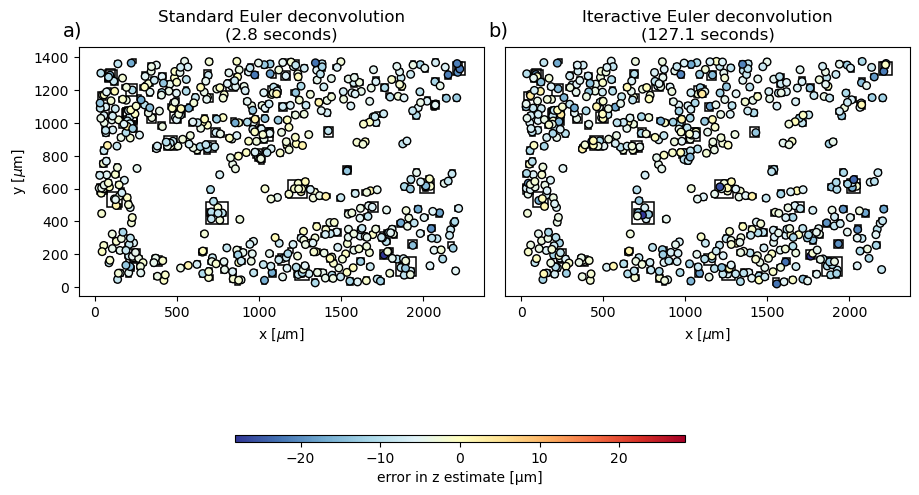

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(9, 9))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.015, shrink=0.5)

# data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
axes = axes.ravel()

scale = vd.maxabs((positions[2]))

ax = axes[0]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions[:2], c=positions[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

ax = axes[1]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

titles = ([r'Standard Euler deconvolution'   +'\n'+ f'({round(inversion_time, 2)} seconds)', 
           r'Iteractive Euler deconvolution' +'\n'+ f'({round(itr_euler_time, 2)} seconds)'])
for ax, letter, title in zip(axes, "a b".split(), titles):
    ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.set_xlabel(r"x [$\mu$m]")

axes[1].set_yticks([])
axes[0].set_ylabel(r"y [$\mu$m]")
plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


fig.colorbar(tmp, **cbar_kwargs, label="error in z estimate [µm]", cax=fig.add_axes([0.25, 0.2, 0.5, 0.0075]))


plt.show()

In [27]:
fig_dir = pathlib.Path("..") / "paper" / "figures"
mpl_rc = {"text.usetex": True, "font.family": "serif", "font.size": 9}

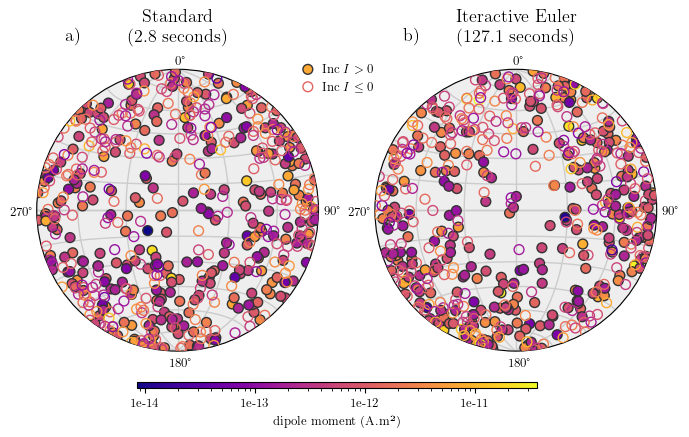

In [28]:
with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(8, 4))
    axes = []

#     estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
#     vmin = np.min(estimated)
#     vmax = np.max(estimated)
    
    estimated1 = mg.vector_to_angles(estimated_dipole_moments)[2]
    estimated2 = mg.vector_to_angles(estimated_dipole_moments_itr_euler)[2]

    
    vmin = np.min([np.min(estimated1),np.min(estimated2)])
    vmax = np.max([np.max(estimated1),np.max(estimated2)])
    
    cmap = "plasma"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize

        
    ## STANDARD METHOD
    ax = fig.add_subplot(1, 2, 1, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs)
    ax.legend(loc=(0.9, 0.9), frameon=False, handletextpad=0.1, prop = {'size' : 9})
    fig.colorbar(
        tmp, 
        cax=fig.add_axes([0.25, 0.05, 0.5, 0.015]), 
        format="%.0g",
        label="dipole moment (A.m²)",
        orientation="horizontal",
    )

    
    ## ITERACTIVE METHOD
    ax = fig.add_subplot(1, 2, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs)

    
    ######
    titles = ([r'Standard'+'\n'+ f'({round(inversion_time, 2)} seconds)', 
           'Iteractive Euler'+'\n'+ f'({round(itr_euler_time, 2)} seconds)']) 
 

    for ax, letter, title in zip(axes, "a b".split(), titles):
        ax.text(0.1, 1.1, f"{letter})   ", transform=ax.transAxes, fontsize=13)
        ax.set_title(title+'\n', fontsize=13, loc='center')
    fig.subplots_adjust(wspace=0.2, hspace=0.5)

    plt.show()


# Paper's figures 

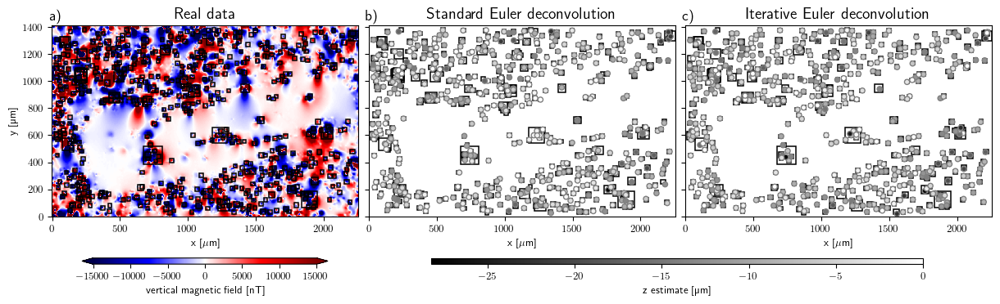

In [29]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    # data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
    axes = axes.ravel()

    ax = axes[0]


    tmp1 = data_up['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir/"euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


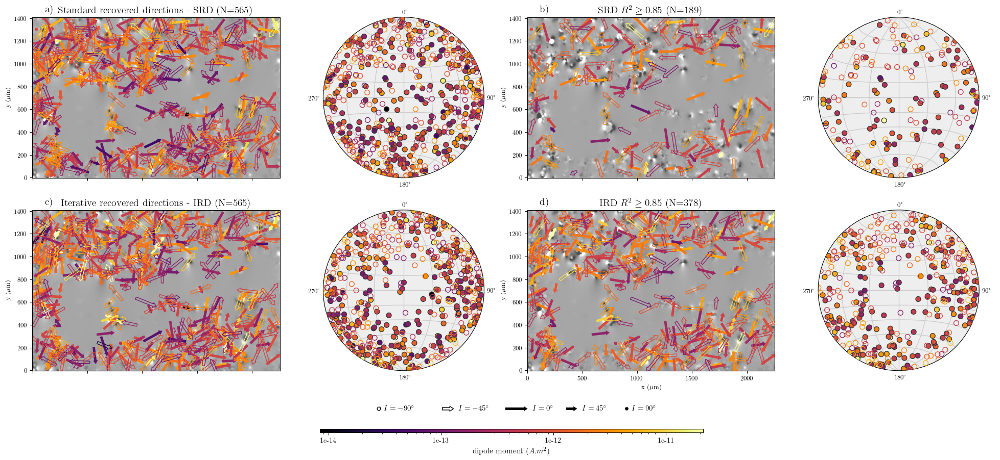

In [30]:
import warnings
warnings.filterwarnings('ignore')

r_square_filter = 0.85

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments_itr_euler, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)   

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq {r_square_filter}$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq {r_square_filter}$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir/"real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    # fig.savefig("real-data-stereograms.pdf", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

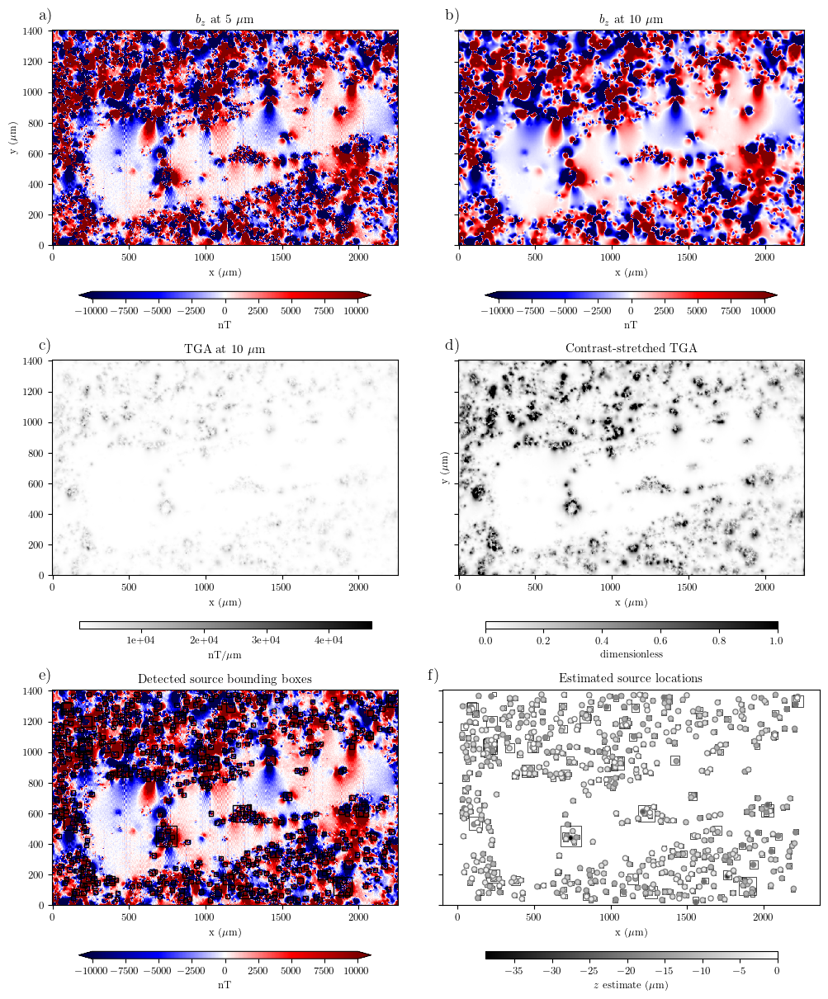

In [31]:
sensor_sample_distance = float(data.z.values.mean())
vmax=+10000
vmin=-10000
with plt.rc_context(mpl_rc):

    fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharey="row")
    axes = axes.ravel()    
    cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.5)
    
    ax = axes[0]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    

    ax = axes[1]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    
    ax = axes[2]   
    ax.set_aspect("equal")
    ax.set_title(f"TGA at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.tga.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="nT/$\mu$m", **cbar_kwargs, format="%.0e")
    
    ax = axes[3]  
    ax.set_aspect("equal")
    ax.set_title(f"Contrast-stretched TGA")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data_up.tga_stretched.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="dimensionless", **cbar_kwargs)
    
    ax = axes[4]  
    ax.set_aspect("equal")
    ax.set_title(f"Detected source bounding boxes")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')    
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)   
    
        
    ax = axes[5]  
    ax.set_aspect("equal")
    ax.set_title(f"Estimated source locations")
    ax.set_xlabel("x ($\mu$m)")
    scale = 100
#     tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r",  add_colorbar=False, add_labels=False)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=0.5,
        )
        ax.add_patch(rect)
    scale = vd.maxabs(positions_itr[2])
    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')
    fig.colorbar(tmp, ax=ax, label="$z$ estimate ($\mu$m)", **cbar_kwargs)    
    
    for ax, letter in zip(axes, "a b c d e f".split()):
        ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)

    plt.tight_layout(pad=0, h_pad=0, w_pad=-10)
    
    # fig.savefig("processing_steps.png", dpi=300, facecolor='w', bbox_inches='tight')
    
    plt.show()

In [32]:
data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


In [33]:
data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
data_up_copy

<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB -1.892e+04 -2.736e+04 ... -4.022e+03 -9.75e+03
    tga      (y, x) float64 5MB 4.196e+03 5.003e+03 ... 2.207e+03 2.451e+03
    x_deriv  (y, x) float64 5MB -3.593e+03 -3.091e+03 ... -1.929e+03 -2.437e+03
    y_deriv  (y, x) float64 5MB -349.0 -861.0 -1.217e+03 ... 519.5 298.2 -214.7
    z_deriv  (y, x) float64 5MB 2.139e+03 3.839e+03 ... -1.031e+03 -150.7

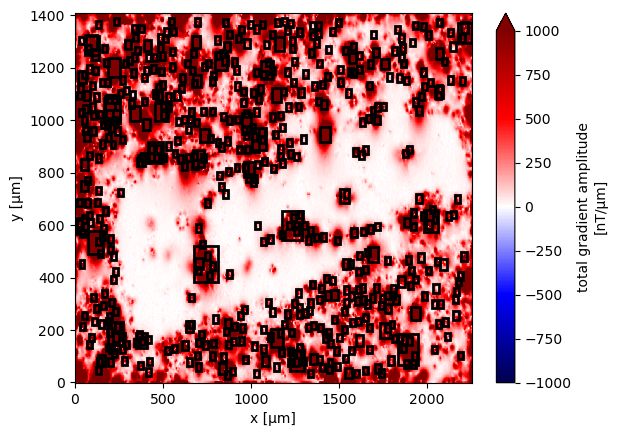

In [34]:
ax = plt.subplot(111)
scale=1000
data_up_copy.tga.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-scale, vmax=scale)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

In [35]:
stretched = skimage.exposure.rescale_intensity(
    data_up_copy.tga, 
    in_range=tuple(np.percentile(data_up_copy.tga, (1, 99))),
)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

In [36]:
start_detection_time = time.perf_counter()

windows_new = mg.detect_anomalies(
    data_up_copy.tga_stretched, 
    size_range=[20,150],
    size_increment=1.3,
    threshold=0.025,
    overlap=0.0,
    exclude_border=15
)
# windows
end_detection_time = time.perf_counter()

In [37]:
detection_time = end_detection_time-start_detection_time
print(f'{np.shape(windows_new)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

557 potential sources detected within 1.2282 seconds


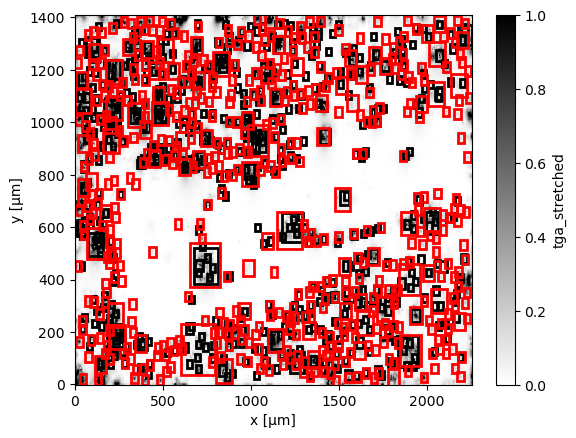

In [38]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

for window in windows_new:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [39]:
def intersects(window1, window2):
    # Verifica se há sobreposição horizontal
    horizontal_overlap = (window1[0] <= window2[1]) and (window2[0] <= window1[1])
    # Verifica se há sobreposição vertical
    vertical_overlap = (window1[2] <= window2[3]) and (window2[2] <= window1[3])
    return horizontal_overlap and vertical_overlap
    


# Remove overlapping windows
non_overlapping_windows = np.copy(windows_new)

for window in windows:
    non_overlapping_windows = [nw for nw in non_overlapping_windows if not intersects(nw, window)]

print("Non-overlapping windows:")
for window in non_overlapping_windows:
    print(window)

Non-overlapping windows:
[1965.01522369 2001.78477631    7.46522369   44.23477631]
[ 404.61522369  441.38477631 1368.11522369 1404.88477631]
[ 261.26522369  298.03477631 1363.41522369 1400.18477631]
[  7.46522369  44.23477631 143.76522369 180.53477631]
[26.26522369 63.03477631  2.76522369 39.53477631]
[1777.83732969 1841.16267031   -5.81267031   57.51267031]
[320.01522369 356.78477631   5.11522369  41.88477631]
[465.71522369 502.48477631  -1.93477631  34.83477631]
[2209.41522369 2246.18477631  331.76522369  368.53477631]
[ 477.46522369  514.23477631 1365.76522369 1402.53477631]
[ 200.16522369  236.93477631 1097.86522369 1134.63477631]
[1871.01522369 1907.78477631 1370.46522369 1407.23477631]
[1140.16522369 1176.93477631  256.56522369  293.33477631]
[1163.66522369 1200.43477631   59.16522369   95.93477631]
[ 89.71522369 126.48477631 900.46522369 937.23477631]
[  -4.28477631   32.48477631 1208.31522369 1245.08477631]
[124.96522369 161.73477631 157.86522369 194.63477631]
[1227.11522369 12

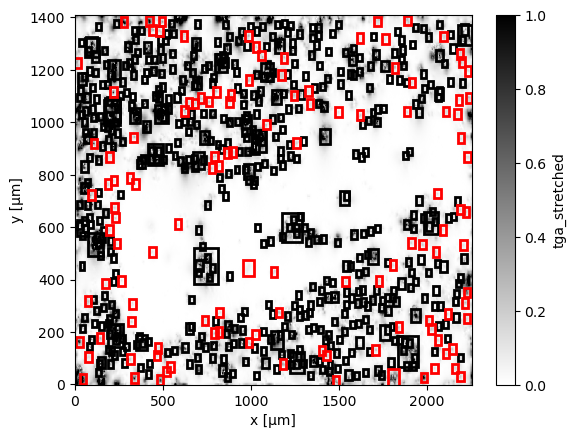

In [40]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [41]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()

data_copy_2 = data_copy.copy(deep=True)
data_up_copy_2 = data_up_copy.copy(deep=True)

positions_itr_enhanced = list(np.copy(positions_itr))
estimated_dipole_moments_itr_euler_enhanced = list(np.copy(estimated_dipole_moments_itr_euler))
windows_enhanced = list(np.copy(windows))
calculated_r2_itr_euler_enhanced = list(np.copy(calculated_r2_itr_euler))
base_levels_itr_euler_enhanced = list(np.copy(base_levels_itr_euler))

#################################
for window in rich.progress.track(np.array(non_overlapping_windows), total = len(np.array(non_overlapping_windows))):
    anomaly = data_up_copy_2.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    base_levels_itr_euler_enhanced.append(base_level)
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
    else:
        print('piorou')


    windows_enhanced.append(window)
    estimated_dipole_moments_itr_euler_enhanced.append(moment)
    for i in range(3):
        positions_itr_enhanced[i]=np.append(positions_itr_enhanced[i], position[i])
    calculated_r2_itr_euler_enhanced.append(r2)
    # estimated_dipole_moments_itr_euler.append(moment)
    print(position)
    print(moment)
    print(mg.vector_to_angles(moment))
    print(r2)
    print()
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy_2.bz.values -= discard
    
#     print(discard.max())
    data_up_copy_2 = (
                hm.upward_continuation(data_copy_2.bz, height_difference)
                .assign_attrs(data_copy_2.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy_2.x, y=data_copy_2.y)
                .assign_coords(z=data_copy_2.z + height_difference)
                   )
    
    
    data_up_copy_2 = data_up_copy_2.assign(mg.data_gradients(data_up_copy_2.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

[1982.81813174   27.19519639   -9.93724669]

[-3.78535647e-15  3.41929524e-13 -1.42704666e-12]

(76.52479606460302, -0.6342713179644687, 1.4674441422402963e-12)

0.9910186749304223

[ 422.3211519  1388.04714106   -5.72507482]

[ 9.26469353e-13 -8.73350300e-14  3.34941886e-13]

(-19.795295095895835, 95.38515948468168, 9.89019179170874e-13)

0.9318923060068679

[ 277.37477713 1384.0732223    -8.56404795]

[-1.61350751e-12  1.08444805e-12  1.78242224e-13]

(-5.238504740237962, -56.09471625709611, 1.952230609237133e-12)

0.9762002311999668

[ 25.22174331 163.33131257  -5.70366511]

[-3.99705861e-14  2.71753733e-14  5.06152192e-13]

(-84.54522486041593, -55.78883178512257, 5.084547084391778e-13)

0.9726250690659178

[ 39.43373361  19.89659164 -11.64206154]

[-4.06834136e-12 -1.14467107e-13 -1.13388727e-12]

(15.567821568395278, -91.6116524508224, 4.224950234959448e-12)

0.9336344879498366

[1796.74571829   30.17135409   -7.09445888]

[ 3.45732167e-13 -4.19010519e-13  6.75589284e-13]

(-51.197741535358354, 140.4734237099998, 8.669033552767338e-13)

0.5430239090199975

[338.14721124  26.1491944   -4.04977285]

[ 1.74473326e-13  1.30361961e-13 -2.38250075e-13]

(47.56802051073738, 53.23386455635318, 3.2279758427605076e-13)

0.8396562123842929

[481.13050482  17.68025507 -11.01839493]

[1.19494474e-12 8.96524300e-13 7.30945818e-13]

(-26.072349635330433, 53.120414273996246, 1.663108697210042e-12)

0.9041686408314124

[2228.87756769  360.75126739   -9.93941315]

[ 1.17510608e-12  1.54855352e-12 -8.91001912e-14]

(2.6243101472830572, 37.1927217642001, 1.945978199387755e-12)

0.9581692321110259

[ 492.45489868 1382.73445695   -3.22917874]

[1.09743770e-13 7.27600842e-14 3.73178992e-14]

(-15.823466479369227, 56.45563472900664, 1.3685887111377678e-13)

0.940017396285946

[ 221.69936042 1116.20361833   -4.93862403]

[ 6.57136391e-14  1.02836419e-13 -1.97320136e-13]

(58.26386398405664, 32.57903950224517, 2.3201044683737065e-13)

0.8257087992986168

[1894.44845779 1391.19483752   -7.94343579]

[-4.06088250e-13  7.34071115e-14  3.51031422e-14]

(-4.862077039414633, -79.75349850555978, 4.1415999519817214e-13)

0.8306348382037759

[1160.65604672  273.9884495    -3.23465588]

[-1.25147450e-13  2.16595863e-14  6.41203629e-15]

(-2.890141449370377, -80.18094352624351, 1.2716971386314055e-13)

0.96111670000095

piorou

[1179.7155844    88.58521409   -1.89992804]

[9.12150075e-14 4.35663521e-14 1.15982091e-14]

(-6.54532601991004, 64.46980314913534, 1.0174833208396092e-13)

0.31390925090171573

[1.06634299e+02 9.23019702e+02 7.23843297e-01]

[-3.55789412e-15  5.95278423e-14 -3.69277038e-14]

(31.767379237454463, -3.420417891478035, 7.014184148503987e-14)

0.7177453518368397

[  11.04973242 1224.8512192    -9.38953471]

[ 5.37746128e-13 -5.14837030e-13 -8.02698730e-14]

(6.153984339291425, 133.75317461322624, 7.487798864517899e-13)

0.8630687691501489

[142.26850901 170.92225808  -9.48905661]

[-1.23049327e-13 -2.67197734e-13 -2.28097187e-13]

(37.789764232012175, -155.27308563288491, 3.722419808990176e-13)

0.9033352342241003

[1242.12693698 1103.63935062   -7.97572868]

[-2.96055626e-13 -1.46687567e-13 -1.81239400e-13]

(28.746544744045984, -116.35717281617896, 3.768473113565971e-13)

0.8586865993817463

[1813.16030176 1205.45671283   -8.79355337]

[-2.24781403e-13 -2.19058758e-13 -1.39750937e-13]

(24.00117138444467, -134.26129875010585, 3.435749450295373e-13)

0.8479049030472929

[2143.12655702  129.678506     -7.57358651]

[-1.10352777e-13 -1.67568927e-13 -1.08508533e-13]

(28.40485775698039, -146.63303578417063, 2.281034464647948e-13)

0.9763192017973582

[2032.76074651  212.33057777   -4.29028203]

[ 1.39247973e-13  7.02350362e-14 -3.02954573e-14]

(10.99301015049563, 63.23416126385915, 1.588734497702739e-13)

0.8583705499112085

[ 71.06716709 318.59078705  -5.00236992]

[-6.94455421e-14  1.35306001e-13 -7.83115238e-14]

(27.244542070180955, -27.169073979606672, 1.7106458456253112e-13)

0.8476191125306051

[2221.70519693  315.58729033   -6.95862695]

[ 1.06428071e-15  1.51488289e-13 -1.82943416e-13]

(50.37247882933421, 0.4025247751791314, 2.3752500457199026e-13)

0.7275337683939596

[1709.64867859  125.3054759    -7.10845212]

[-9.75664591e-14 -1.29904164e-13 -8.70663691e-14]

(28.187491976192423, -143.09107288606975, 1.8432270195901215e-13)

0.7833188685678184

[2011.58343298  246.24172385   -8.44186645]

[ 2.32719555e-14 -2.89875797e-13  8.77054468e-14]

(-16.782880235200814, 175.409995624619, 3.0374628765063853e-13)

0.972050753386077

[2108.88489042 1045.54856508  -13.51358517]

[-4.01304555e-13  4.05526145e-13 -2.35782172e-13]

(22.454012983478876, -44.70021331378479, 6.17324900793197e-13)

0.9328235916536994

[ 437.04310164 1354.25770783   -6.09030199]

[ 1.87096574e-13 -1.11354436e-13 -2.77409358e-14]

(7.261030154950871, 120.75987674354528, 2.1948689676704976e-13)

0.8053956682248308

[2240.25611209 1089.1251488   -11.29329   ]

[ 2.44780549e-13 -5.23039081e-13  1.11458518e-13]

(-10.924172480784451, 154.92056239682205, 5.881414782238987e-13)

0.8431660002476018

[ 801.56836025 1117.87812507   -5.25800334]

[-1.29037228e-13  1.00377999e-13 -7.51022741e-15]

(2.6302720418179164, -52.12067014112885, 1.636543690206737e-13)

0.9016314682495895

[ 483.17208296 1350.75745442   -4.25009301]

[ 1.28064209e-13 -2.07165146e-14 -2.75002682e-14]

(11.968522076930267, 99.18894314123322, 1.3261176517311236e-13)

0.8378187220561188

piorou

[ 980.48984121 1334.80698281   -2.19769661]

[ 7.60444667e-14 -4.95558308e-14  1.98091769e-14]

(-12.311387950129129, 123.09104555544327, 9.290287817010008e-14)

0.455051251255723

[188.81969649 764.59757823  -5.23922138]

[ 7.16772368e-14 -1.23305962e-13  1.15807805e-14]

(-4.642074036086651, 149.83074334621455, 1.4309472743307748e-13)

0.9651005856573924

[1983.26655947  534.24178744   -5.97850697]

[ 1.85360891e-13 -3.62584169e-14 -2.76183506e-14]

(8.319197813317306, 101.0678672079732, 1.9088244072799245e-13)

0.8592135051570101

piorou

[2045.51753751  507.55422893   -2.73543302]

[-7.99520309e-14 -2.42981822e-14 -1.55722519e-14]

(10.556213764880832, -106.90452538238243, 8.500131718819636e-14)

0.5682999929400421

[ 996.40425967 1167.64659436   -8.82374768]

[3.75225182e-13 1.56020031e-13 1.08523419e-13]

(-14.952241362365857, 67.42227645070616, 4.2061088873961897e-13)

0.9171014931087903

[1131.72697304  427.17635905   -3.81630521]

[ 7.28545655e-14  5.75475980e-14 -2.48852090e-15]

(1.5353895015097836, 51.69490059252332, 9.287468167508352e-14)

0.9202154045647938

[193.19349075 588.09461494 -12.70742061]

[ 3.94946255e-13  1.32539107e-13 -3.72194140e-13]

(41.77840960284118, 71.44888057400765, 5.586390933499287e-13)

0.8993862551681904

[2102.20429631  114.55637752   -8.1926705 ]

[-1.81123387e-13 -5.27517602e-14 -1.17126393e-13]

(31.834886441031244, -106.23807640153417, 2.220518437016559e-13)

0.8126567707888671

piorou

[ 1.62666276e+03  1.02275133e+03 -2.24425948e-01]

[-2.36809233e-14 -2.14844436e-14 -5.90958049e-15]

(10.471344443619309, -132.21578818942515, 3.251600508843004e-14)

0.5208239654918753

[1260.85960303  921.95069447   -6.19315553]

[ 1.21912013e-13  4.35343708e-14 -9.27297035e-14]

(35.61500410473935, 70.34852417698781, 1.5923748992043872e-13)

0.9671851236644502

piorou

[ 611.97636903 1043.85790144   -2.6080249 ]

[ 6.18114948e-14  3.98267896e-14 -5.21773255e-14]

(35.359305459518694, 57.20524014868467, 9.016267164682588e-14)

0.36103876962334047

[791.1039287  866.36183812  -8.87677376]

[-6.99210617e-14 -2.70538043e-13 -1.27743514e-13]

(24.56804975496567, -165.5089001507308, 3.072428894879114e-13)

0.8782487239920002

[2194.46945717   28.60183092  -10.94262743]

[-4.42422606e-13 -3.24454530e-14  1.07402744e-13]

(-13.610006887475947, -94.19432816656891, 4.564272330797234e-13)

0.8105497667621968

[321.38394762 241.6169628   -6.5596824 ]

[ 4.92005999e-14  8.64265422e-14 -7.70813031e-14]

(37.77848178551111, 29.65184262303183, 1.258243756686895e-13)

0.9729926711007976

piorou

[ 885.12574708 1110.81293133   -2.28130147]

[-5.79356106e-14 -1.55383592e-15  9.97076287e-15]

(-9.761546035870108, -91.53630732451434, 5.880786936519493e-14)

0.42335619891156795

piorou

[ 757.04064729 1074.16637603   -4.39044679]

[7.02205440e-14 8.56909874e-14 2.82604851e-14]

(-14.310248730368382, 39.33333050423158, 1.1433514394052252e-13)

0.5380925635952639

[2205.380188   1231.26419169  -12.03248085]

[-2.82694164e-13  1.85014704e-13  3.19931170e-13]

(-43.43909575457077, -56.7964769369701, 4.652981671916467e-13)

0.8310498419075689

[310.0053012  100.47514993  -1.63780506]

[-4.30737605e-14  1.72932045e-14 -2.69137516e-14]

(30.107017150784472, -68.12558227711946, 5.3654019346848975e-14)

0.7826216902041476

[334.90467586 947.61414401  -2.47412652]

[7.97118761e-14 1.38884540e-14 9.91242584e-15]

(-6.9843661931603, 80.11638979418441, 8.151765780706096e-14)

0.6862967418611697

piorou

[1.90747586e+03 1.16007984e+03 3.70658918e-01]

[-5.38060341e-15  1.40008910e-14  3.96421108e-15]

(-14.804473556719305, -21.021985262134645, 1.5514213226117894e-14)

0.12307419613853854

[1542.23733139  390.9911416    -8.64008654]

[ 1.05608731e-13 -2.94818724e-14 -1.54358810e-13]

(54.612446768407025, 105.5976771667344, 1.8933839337915322e-13)

0.9110987396396748

[740.78302199 237.42268207 -12.78991138]

[-1.62128554e-13 -5.72661731e-13 -1.17960149e-13]

(11.21049982350274, -164.1924396592731, 6.067468359450301e-13)

0.9505411319151994

[1156.19565143 1182.10265392  -29.25944352]

[-6.89700778e-12  2.12861116e-12 -1.50905833e-12]

(11.808647638923615, -72.8482984145868, 7.374073419068344e-12)

0.9297018277714867

piorou

[1798.84300749  459.25081523   -4.00678522]

[ 1.00630287e-13  2.61857328e-14 -8.15313446e-16]

(0.4492440786173326, 75.4141270772955, 1.0398467189147472e-13)

0.7123590273405189

piorou

[1058.41340358 1238.24422506   -2.50196912]

[-6.34531767e-14  3.76372148e-14  7.81042787e-14]

(-46.632456921868716, -59.32572578918279, 1.0743902419219309e-13)

0.2936052434211418

[218.23669744 780.1766187   -5.68318453]

[ 5.34249110e-14 -9.78907439e-14  3.98291960e-14]

(-19.654029511381196, 151.37602739945137, 1.1841952422692986e-13)

0.9772369947287269

[2188.67643514 1261.33063886  -14.85933711]

[ 4.01705724e-13 -1.03020578e-12  3.14113365e-14]

(-1.627173388977893, 158.6978142496733, 1.106199849198493e-12)

0.9596238641648177

[1724.32522111 1386.03349267  -10.34614948]

[-1.10505798e-13  5.92458764e-13  1.36551775e-13]

(-12.766279184689102, -10.56543919019354, 6.17952510927177e-13)

0.9765306411745737

[227.51257974 669.75802503  -6.93049058]

[ 1.93690746e-14 -1.79680329e-13 -4.72364130e-14]

(14.64809985686321, 173.84742138806405, 1.86792559944839e-13)

0.8896211405586074

[981.82802755 155.71888127 -17.14028   ]

[-1.08383538e-13  1.37676141e-12 -1.12710298e-13]

(4.665782348005954, -4.501243499971267, 1.3856127052444567e-12)

0.921617349958095

[228.46177211 630.87108661  -2.69715343]

[4.97500619e-14 2.84234277e-16 1.97786017e-14]

(-21.680435705153666, 89.67265875432453, 5.35382343576027e-14)

0.529282817746082

[2091.19530389 1327.73519502   -6.14384008]

[ 8.68882777e-14 -1.66737110e-13  2.68382134e-14]

(-8.12367343718306, 152.47555591820014, 1.8992400182444254e-13)

0.7370686215073953

[2230.16127849  658.64144521   -4.78302504]

[ 1.08781812e-13  2.22268467e-14 -5.88298481e-14]

(27.91726233277726, 78.45199214187281, 1.2565216453716784e-13)

0.8445693319834151

[2067.10470439  167.25703397   -6.52903662]

[-1.07388209e-13  5.80135070e-14  8.01972416e-14]

(-33.306916268821865, -61.62109263804108, 1.460458558825829e-13)

0.8554594596322058

[1430.4524092  113.6435833   -4.2564081]

[ 9.32909612e-14  1.21538299e-13 -7.70746430e-15]

(2.8798350878873253, 37.50929912894547, 1.5340849616005434e-13)

0.8690955582798913

[2171.66302837   61.86974324  -14.041169  ]

[-6.18542259e-13  6.32447188e-14  2.22970941e-13]

(-19.728260832303956, -84.16190888489535, 6.605380085215285e-13)

0.793984403175068

[2230.50368888  252.02383098  -13.53936128]

[-4.22600339e-13 -5.16430369e-13  1.11161326e-13]

(-9.457677220653027, -140.70618056108734, 6.764970160040461e-13)

0.8807480338314164

[821.24767545 203.49773442 -12.38834887]

[-3.30059147e-13 -5.04566306e-13  1.17582485e-13]

(-11.035204507213955, -146.8095254839196, 6.142897024791898e-13)

0.8591475252568364

[1924.28246911  543.9901555   -16.54745821]

[-3.78942898e-13  4.54792019e-13  3.27672544e-13]

(-28.96562462859006, -39.80181979192169, 6.766112593733375e-13)

0.8648148455187576

[ 680.66510892 1071.82167849  -16.37515457]

[-1.09934730e-12 -4.17819713e-13 -1.51301999e-13]

(7.330871139836907, -110.80987588853762, 1.1857613979803567e-12)

0.951584554471324

[2209.47517808  525.09367      -9.63758755]

[8.76558138e-15 2.10022773e-13 8.89855361e-14]

(-22.944211620204708, 2.389928957773887, 2.282648160148682e-13)

0.9330098082151398

[1030.61365214 1291.07477187  -13.17704678]

[-2.89668860e-13 -2.53616703e-13 -1.83929198e-13]

(25.535250238380566, -131.20344722319933, 4.2668422771125366e-13)

0.7664812836797539

[1728.39795782  389.33872472  -13.39550861]

[ 3.85991851e-13  4.14864626e-13 -1.23398203e-13]

(12.285189731286982, 42.93524558798509, 5.799392067791458e-13)

0.9302504162034179

[1187.91814647 1253.10498576  -11.46062271]

[ 2.97043549e-13 -3.70350348e-13  8.58997751e-14]

(-10.255809933225898, 141.26826207220205, 4.824655648010085e-13)

0.9176760256942242

[1486.26188024   13.87999808   -3.75870941]

[ 4.24424959e-14 -2.11971012e-13  9.09747867e-14]

(-22.822920850305568, 168.6775164053488, 2.345410138395405e-13)

0.6990365556046514

[772.95753363 827.59272126  -7.69047786]

[ 1.21727687e-13 -1.86122270e-13  6.31038336e-14]

(-15.84117431707661, 146.81451117422023, 2.31173577847071e-13)

0.9051436612381394

[862.25698672 878.33190194 -19.59124109]

[ 5.99098281e-13 -7.56350327e-13  6.30876084e-15]

(-0.3746185400179974, 141.6175724089078, 9.648960400689839e-13)

0.6881992794136595

piorou

[ 91.97140612 724.20888602  -1.18951868]

[2.94467768e-14 8.37952331e-14 1.94694581e-14]

(-12.363942165563385, 19.362164089049003, 9.092751812016597e-14)

0.21183337140229597

[1319.64576645 1113.04135018  -17.25117215]

[-5.63094295e-13 -4.01098894e-13 -3.79228173e-13]

(28.746449731973787, -125.46273168858738, 7.88523630120436e-13)

0.9242645639606528

[2233.54939345 1200.63035749   -7.5046973 ]

[-4.48383768e-14  9.99005574e-14 -9.05854643e-14]

(39.59933483443717, -24.171978243952495, 1.4211378445303844e-13)

0.9147655906807379

[793.0934647  195.22270131   2.05761469]

[ 1.84024915e-14 -4.42042140e-15 -1.58041171e-15]

(4.773408705000927, 103.50698857936908, 1.8991827755467886e-14)

0.4731822753963698

piorou

[ 880.8644537  1071.2024915    -6.83224783]

[-1.65203343e-13  1.36723291e-14  1.61350945e-14]

(-5.559390078940769, -85.26894829363289, 1.665515485355649e-13)

0.7949630293083741

[1764.79629081 1321.37463001  -11.07003282]

[ 2.24372522e-13  1.74584693e-13 -2.82507210e-14]

(5.67494521783295, 52.113445828838984, 2.8569379919754437e-13)

0.9754695414147312

piorou

[2233.56364671  870.54758141   -3.47856881]

[-6.59126686e-14  6.54004695e-15 -6.18261832e-15]

(5.332639427467939, -84.33349325531921, 6.652425776988706e-14)

0.6827384808729499

piorou

[892.48579465 886.9231908   -2.66376092]

[ 1.20755066e-14 -8.69714165e-14  7.24106110e-15]

(-4.714334477578902, 172.0953300726235, 8.810379173960168e-14)

0.5538674511420756

[1839.57125916  211.30440014   -4.22356163]

[-2.29731521e-14 -1.53774644e-13 -1.19080194e-15]

(0.43880923841904246, -171.50314251169206, 1.5548577029885304e-13)

0.8952523525961775

piorou

[321.70018941 303.86310948  -0.52957346]

[ 1.18784950e-14 -5.03400323e-15 -4.84250839e-15]

(20.57385556401477, 112.96680977922175, 1.3780047901231006e-14)

0.18028750925237536

[2123.44491469  266.923013     -6.31241976]

(-16.970691800079, -84.4235852807054, 1.137905788500218e-13)

0.8732972022175874

[983.65482237 443.13000005 -17.97759427]

[ 5.12124384e-13  7.13268815e-13 -7.88295933e-14]

(5.129976139332792, 35.67820789630586, 8.816109641862536e-13)

0.9958074104666953

[441.15078653 503.25198078  -8.12453437]

[ 3.78296592e-14  7.47232340e-14 -5.21842387e-14]

(31.92577579094146, 26.851437038720608, 9.868049240191683e-14)

0.8066374546697537

[1408.99944655  127.00770655  -16.63851721]

[ 9.67458477e-13  2.02701960e-13 -1.77039465e-13]

(10.154315603165758, 78.16656037907929, 1.004194682972846e-12)

0.919870434765006

[175.29133448 388.71863099 -18.93620032]

[ 2.00772719e-13  8.31197389e-13 -4.33212724e-13]

(26.867746222771682, 13.579479325764714, 9.585781390123276e-13)

0.9789227018310837

[580.96841999 614.7737544   -8.44551403]

[ 1.00459724e-13 -2.63840459e-14  4.80276446e-14]

(-24.815694411485854, 104.71543655853556, 1.1443307537140832e-13)

0.8137288614276256

[ 657.59340757 1071.45620403  -13.68834231]

[-4.50017724e-13  9.41992540e-14  1.88520889e-13]

(-22.295202044758867, -78.17735316970109, 4.96920091128701e-13)

0.8970267466802345

[1349.45303237 1071.08078205  -15.81233629]

[ 8.68018271e-13  2.12783190e-13 -1.67292045e-13]

(10.602304798082237, 76.2263072829762, 9.092409106696065e-13)

0.9692526404512948

piorou

[ 1.89365806e+03  1.04718088e+03 -1.48078877e+00]

[ 1.27264781e-15  2.72102520e-14 -7.28670988e-15]

(14.97600539823381, 2.6778233743954187, 2.8197758549620003e-14)

0.3489426162949476

[1028.60845365  190.25157983   -2.7608803 ]

[ 2.10797519e-14  4.22905418e-14 -5.19533633e-15]

(6.274311168871808, 26.49399439776757, 4.753774697012182e-14)

0.8749909253980533

[817.68846389 832.5383343   -3.45274041]

[-4.54995927e-14 -2.60860725e-14  3.47645449e-15]

(-3.792302985908783, -119.82674283750258, 5.2562171253723024e-14)

0.8853248085029309

[2200.9963946   937.98544111   -5.32255405]

[ 7.76114628e-14 -5.87720541e-14 -4.83596577e-14]

(26.415573851194154, 127.13518934061136, 1.0870303583189824e-13)

0.6485469575394245

piorou

[1507.31357226 1037.76814644   -3.39265368]

[ 5.06617229e-14 -5.24324694e-15  3.44759107e-15]

(-3.872423866509024, 95.90880319575042, 5.104887554853237e-14)

0.6689593811823558

piorou

[2174.20446403 1029.45057589  -12.29405237]

[-6.38576381e-14  3.11863202e-14  2.66652182e-13]

(-75.07684630327252, -63.97038477132143, 2.7595972632498684e-13)

0.6425464816718995

[518.49381854  55.48479443  -6.55668097]

[-9.17669791e-14  1.37751847e-13 -7.32035252e-14]

(23.85812457206565, -33.67060161893003, 1.8098482198379564e-13)

0.8052294240467132

piorou

[831.32252065 255.22479891  -4.31772921]

[ 4.02988912e-15 -1.30360377e-14 -6.52522320e-14]

(78.18921863757382, 162.82181616273908, 6.666357379667978e-14)

0.3989709553175914

[233.82838046 537.5829748   -7.20926508]

[ 5.48629585e-14 -1.19702433e-13 -1.70826173e-14]

(7.391812815314028, 155.37669493797986, 1.327796389131474e-13)

0.9462103844654023

[2065.99979709  727.87525656   -3.02045538]

[-3.30952636e-14 -1.51882856e-15  2.02716179e-14]

(-31.461597541360096, -92.6276101207991, 3.883995116250233e-14)

0.6646303189904702

[544.29971164  65.35025911  -3.42379044]

[-4.99064763e-14  2.22078257e-14  3.76915403e-14]

(-34.60609152218812, -66.01146902273807, 6.636637783920793e-14)

0.620642689076978

[ 73.60435206 113.53748066 -12.77271601]

[ 4.68191080e-13 -1.09854368e-13  2.28195235e-13]

(-25.384844780440392, 103.20477211335546, 5.32300605600179e-13)

0.9201030521141396

[1615.05181114 1320.84424027  -15.13503904]

[ 4.11895477e-13 -2.37900897e-13  1.21189386e-13]

(-14.293729253625981, 120.00969444651825, 4.908580128047655e-13)

0.9849768402308067

[2043.06794784   60.04695932   -3.76288791]

[-2.04383086e-14  2.26898728e-15 -3.05261125e-14]

(56.03388016483561, -83.66516912139454, 3.680647099125547e-14)

0.9569460583109755

piorou

[ 698.44457562 1096.61544176   -6.91729593]

[-5.58935949e-13 -1.54522478e-13  7.62791576e-14]

(-7.493549364844591, -105.45390175934962, 5.848975139103124e-13)

0.5473044048000161

piorou

[1087.08414087  971.32620639  -16.00691455]

[-1.77123518e-13  1.02037160e-12 -1.03395225e-12]

(44.95353288528999, -9.847688395430074, 1.4634166199053186e-12)

0.5713617959699565

[472.3521865  135.40420089  -8.6638275 ]

[-3.52727584e-13  5.41477611e-13  3.19937861e-13]

(-26.339214155348206, -33.08089468007481, 7.210929105182843e-13)

0.7880475738053851

[ 611.56296294 1336.45490331  -25.61774185]

[ 1.47227626e-12 -2.42718786e-12 -2.10601430e-12]

(36.57043962727139, 148.75996446810927, 3.5347043065241536e-12)

0.9557296566770237

[311.51437143 787.44662077 -12.9661941 ]

[2.96478817e-13 3.02058265e-14 6.14957581e-14]

(-11.6594580559337, 84.18266926744886, 3.042923084882399e-13)

0.9081733524134363

[2177.79037065 1087.17556043   -4.53108691]

[-5.27729432e-14 -4.40870825e-14 -2.40566909e-14]

(19.28178181677092, -129.87574396451208, 7.285175874462109e-14)

0.7498372519207288

[2194.58601563  672.39551278  -12.71177271]

[ 3.43170069e-13 -7.34683436e-14 -1.66280909e-13]

(25.35193551793548, 102.08388584552105, 3.8834602405955677e-13)

0.7872119108628342

[198.31442385 873.74981643 -19.37396075]

[ 1.04034842e-12  6.87943638e-13 -1.73318872e-13]

(7.911309174056315, 56.52482154512975, 1.2592182946040446e-12)

0.9244883220513163

[343.66655328 764.15149162  -4.77048049]

[2.75124426e-15 3.84545558e-14 2.60696878e-14]

(-34.066813617798395, 4.092273092432769, 4.653977688472722e-14)

0.8840067644396938

[ 2.63890541e+02  3.96413181e+02 -1.87811017e-01]

[-8.57865052e-15  2.30543364e-15 -1.00595904e-14]

(48.55417024394285, -74.95768940856402, 1.3420269321137454e-14)

0.916553062445388

piorou

[2083.68742923  597.83718315   -2.93671189]

[-4.47840325e-14  5.19509802e-14 -2.79679682e-15]

(2.334993345517424, -40.76278571752318, 6.864645643320313e-14)

0.30970206683117785

[470.80910194 135.50590362  -8.96294301]

[-5.79737072e-14 -4.08576715e-13 -2.87395316e-13]

(34.85451938800653, -171.92410585999434, 5.028836355944041e-13)

0.9466072296132906

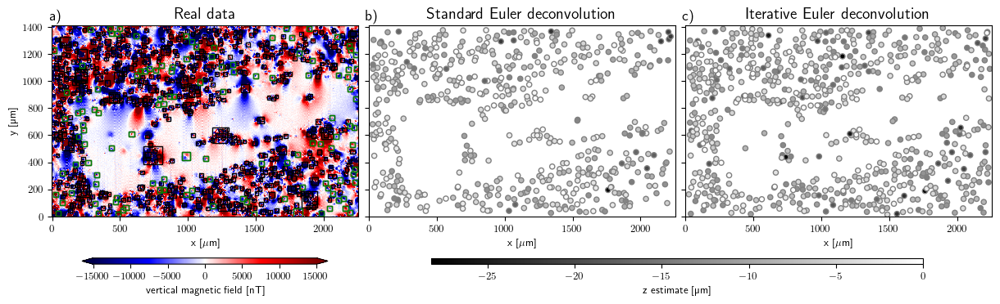

In [42]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    axes = axes.ravel()

    ax = axes[0]
    tmp1 = data['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_enhanced:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)

    for window in non_overlapping_windows:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="g",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    tmp = ax.scatter(*positions_itr_enhanced[:2], c=positions_itr_enhanced[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir / "euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


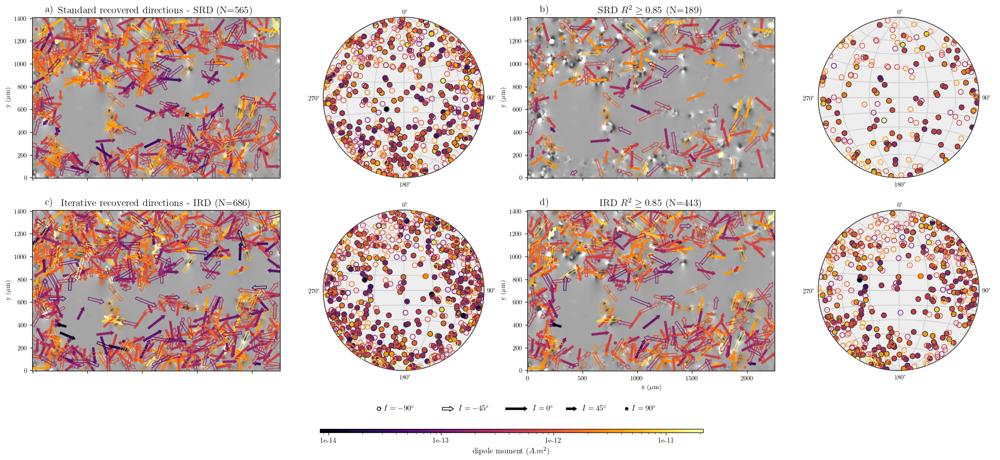

In [44]:
import warnings
warnings.filterwarnings('ignore')

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
                                  np.array(positions_itr_enhanced)[1][pos_filter], 
                                  np.array(positions_itr_enhanced)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler_enhanced, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler_enhanced).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq 0.85$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq 0.85$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir / "real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

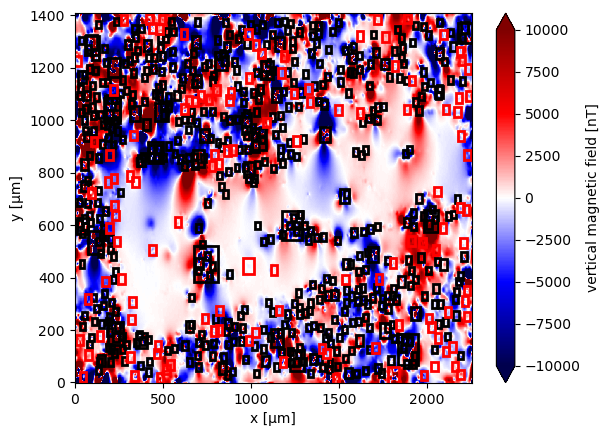

In [45]:
ax = plt.subplot(111)
data_up_copy_2.bz.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-10000, vmax=10000)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [46]:
np.asarray(calculated_r2_itr_euler_enhanced).T

array([ 0.88692873,  0.98310811,  0.86340395,  0.59592707,  0.82364884,
        0.98251891,  0.88710411,  0.68386555,  0.97629429,  0.78758524,
        0.83876058,  0.96713736,  0.9958835 ,  0.92658033,  0.9514411 ,
        0.62185829,  0.94002504,  0.94626709,  0.88862322,  0.96943849,
        0.95799062,  0.96364047,  0.77636576,  0.90803391,  0.63390123,
        0.95161849,  0.952611  ,  0.99280866,  0.97282967,  0.35646972,
        0.86495592,  0.92696479,  0.97460385,  0.90297038,  0.97689514,
        0.78399387,  0.89867458,  0.88872533,  0.86376653,  0.40421208,
        0.42289963,  0.97422659,  0.82741025,  0.19155044,  0.43298181,
        0.62949368,  0.89075034,  0.96258666,  0.9653574 ,  0.9376913 ,
        0.97319842,  0.8919075 ,  0.61323152,  0.95958983,  0.76665699,
        0.9611787 ,  0.93729035,  0.97734551,  0.9681129 ,  0.77336066,
        0.94637255,  0.77771509,  0.75077691,  0.9519674 ,  0.87863888,
        0.78394941,  0.35131506,  0.66836665,  0.9890507 ,  0.95

# Show the observed and predicted data

In [47]:
predicted_data = mg.dipole_bz([coordinates[0], coordinates[1], data_up.z], positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced)
residuo = data.bz.values - predicted_data

data_up = data_up.assign(predicted_data=(['y','x'],predicted_data))
data_up.predicted_data.attrs = {"long_name": "predicted-data", "units": "nT"}

error = data_up.bz.values - data_up.predicted_data.values

data_up = data_up.assign(error=(['y','x'],error))
data_up.error.attrs = {"long_name": "residual-data", "units": "nT"}

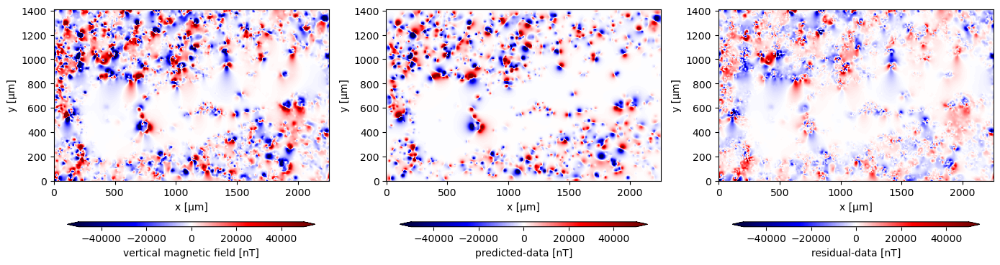

In [48]:
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.1, shrink=0.9)
for field, ax in zip(["bz", "predicted_data", "error"], axes.ravel()):
    vmax = +50000
    vmin = -50000
    data_up[field].plot.pcolormesh(ax=ax, cmap="seismic", cbar_kwargs=cbar_kwargs, vmax=vmax, vmin=vmin)
for ax in axes.ravel():
    ax.set_aspect("equal")
plt.tight_layout()

1
Individual source:   R2 = 0.8869287260589606


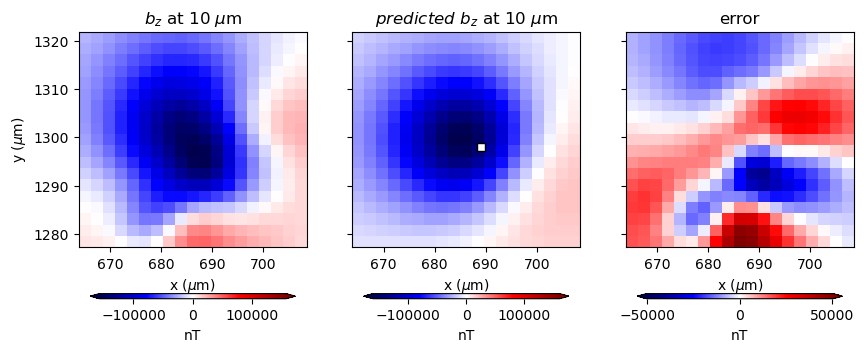

2
Individual source:   R2 = 0.9831081110136


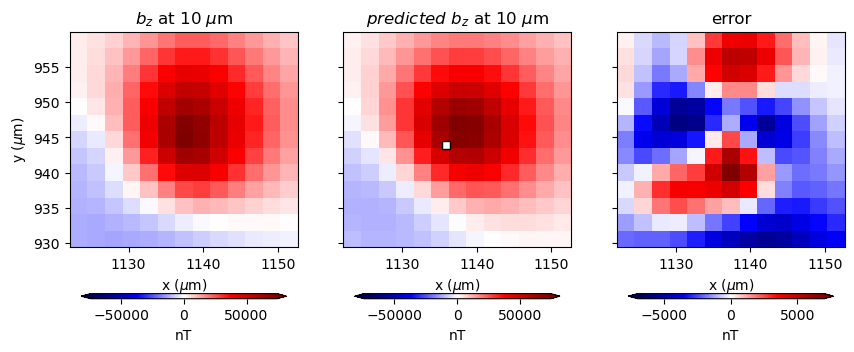

3
Individual source:   R2 = 0.8634039538310765


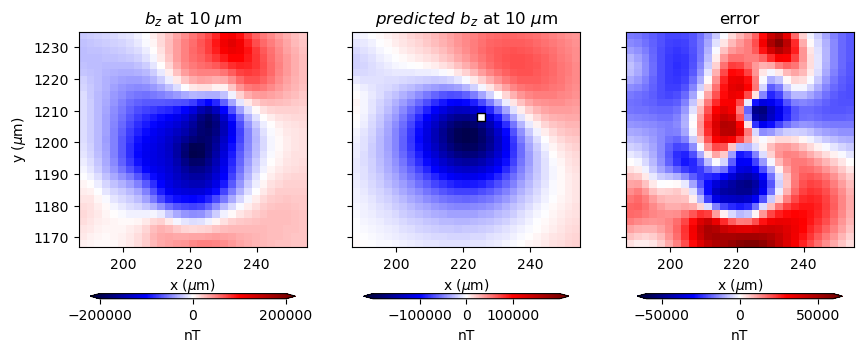

4
Individual source:   R2 = 0.5959270683389954


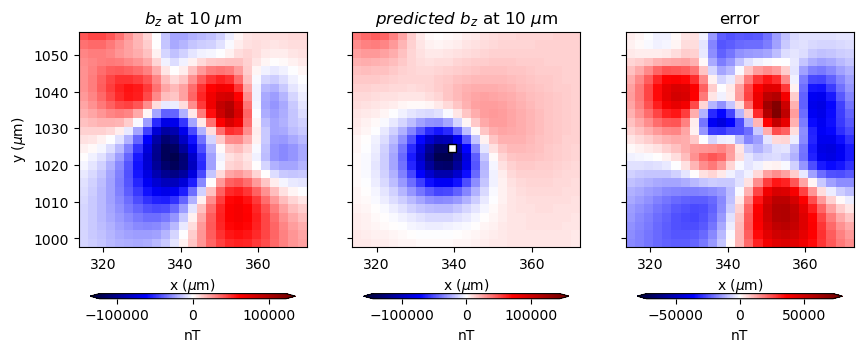

5
Individual source:   R2 = 0.8236488404664345


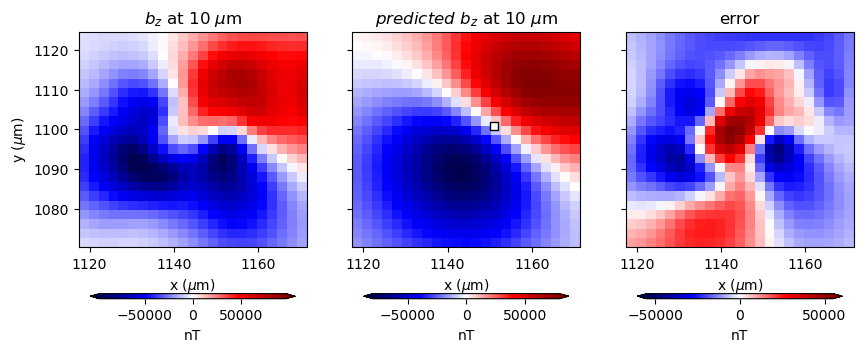

6
Individual source:   R2 = 0.9825189085912146


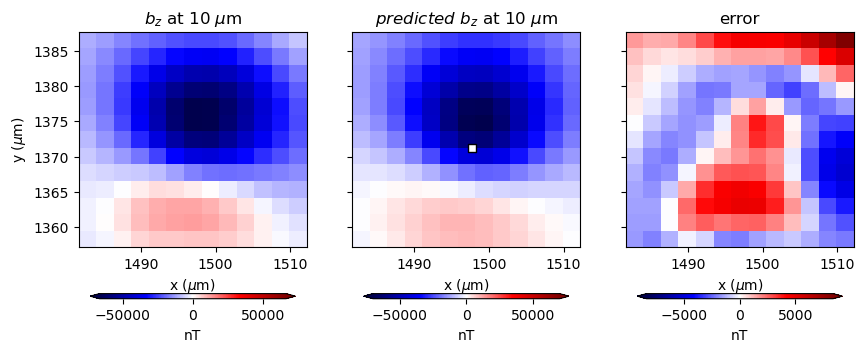

7
Individual source:   R2 = 0.887104110027235


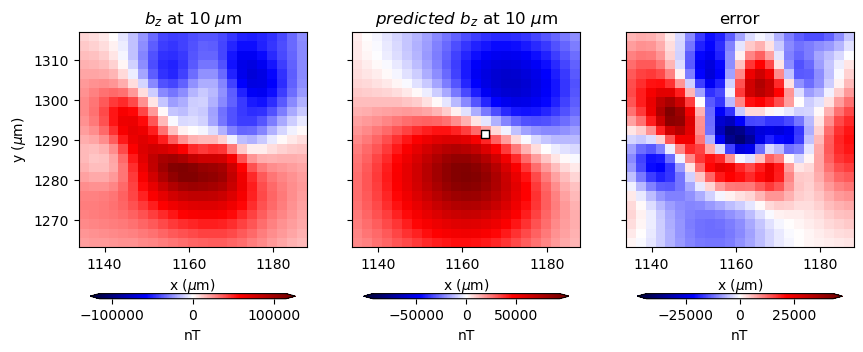

8
Individual source:   R2 = 0.6838655475839873


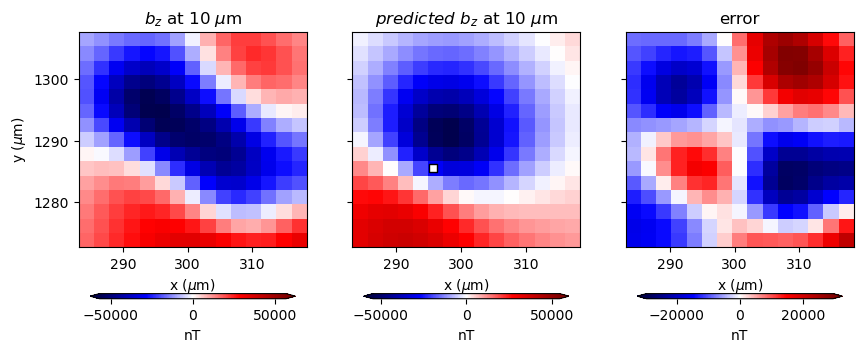

9
Individual source:   R2 = 0.9762942947225296


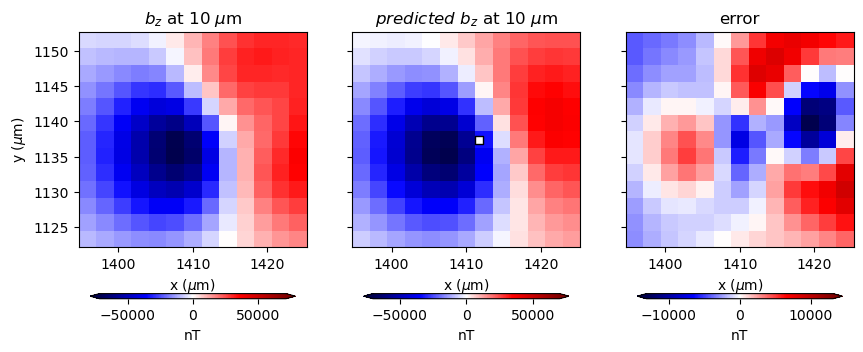

10
Individual source:   R2 = 0.78758523912026


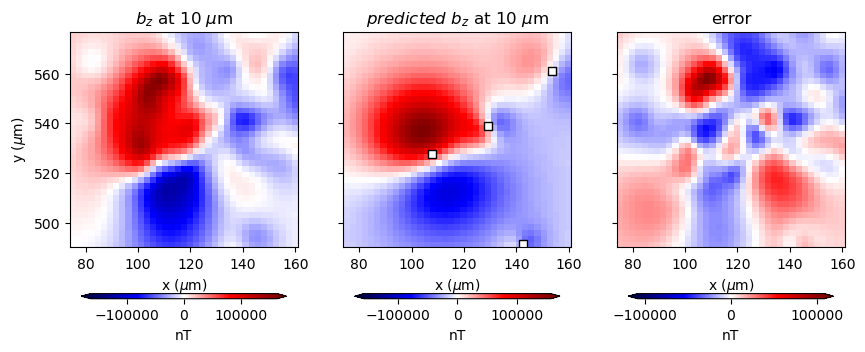

In [49]:
i = 0
slice_start=0#-20
slice_end=10#-1
for window, r2, base_level in zip(windows_enhanced[slice_start:slice_end], 
                                  calculated_r2_itr_euler_enhanced[slice_start:slice_end], 
                                  base_levels_itr_euler_enhanced[slice_start:slice_end]):

    if r2>=-np.inf:
        i=i+1
        print(i)
        # local_data = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        local_data = data_up.copy(deep=True)
        local_data = local_data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        
        fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharey="row")
        axes = axes.ravel()    
        cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.9)
        
        ax = axes[0]
        ax.set_aspect("auto")
        ax.set_title(f"$b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        ax.set_ylabel("y ($\mu$m)")
        local_data.bz.values +- base_level
        tmp = local_data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        # ax.scatter(dipole_coordinates[0], dipole_coordinates[1], color='w', marker='o', edgecolors='k')
        
        ax = axes[1]
        ax.set_aspect("auto")
        ax.set_title(f"$predicted~b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        local_data.predicted_data.values += base_level
        tmp = local_data.predicted_data.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.scatter(positions_itr_enhanced[0], positions_itr_enhanced[1], color='w', marker='s', edgecolors='k')
        
        ax = axes[2]   
        ax.set_aspect("auto")
        ax.set_title("error")
        ax.set_xlabel("x ($\mu$m)")
        
        local_data.error.values = local_data.bz.values - local_data.predicted_data.values
        tmp = local_data.error.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        
    
        print(r"Individual source:   R2 = %s"%(r2))
    
        plt.show()

In [50]:
# Nome do arquivo ZIP
import os
output_folder = "csv_files_real_data"
os.makedirs(output_folder, exist_ok=True)

In [51]:
import os
# Criar um DataFrame com os vetores
standard_dataframe = pd.DataFrame({
    'mx_standard': np.asarray(estimated_dipole_moments)[:,0],
    'my_standard': np.asarray(estimated_dipole_moments)[:,1],
    'mz_standard': np.asarray(estimated_dipole_moments)[:,2],
    'r_2_standard': np.asarray(calculated_r2),
})
standard_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_standard.csv'))
standard_dataframe.to_csv(standard_csv_name, index=False)

# Criar DataFrame para os vetores iterativos
iterative_dataframe = pd.DataFrame({
    'mx_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,0],
    'my_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,1],
    'mz_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,2],
    'r_2_iterative': np.asarray(calculated_r2_itr_euler_enhanced),
})

# # Salvar DataFrame iterativo como CSV
iterative_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_iterative.csv'))
iterative_dataframe.to_csv(iterative_csv_name, index=False)